<a href="https://colab.research.google.com/github/Immaniyelu2001/projects_v/blob/main/Braintumor_yolo8s.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics

In [2]:
import zipfile

zip_path = "/content/dataset.zip"
extract_path = "/content/dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [3]:
import os
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import yaml

train_path = "/content/dataset/Train"
val_path = "/content/dataset/Val"

In [4]:
classes = ["Glioma", "Meningioma", "No Tumor", "Pituitary"]

def load_data(data_path):
    images = []
    labels = []
    for class_label in classes:
        class_path = os.path.join(data_path, class_label, 'images')
        label_path = os.path.join(data_path, class_label, 'labels')
        for img_file in os.listdir(class_path):
            img = cv2.imread(os.path.join(class_path, img_file))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label_file = img_file.replace('.jpg', '.txt')
            label_file_path = os.path.join(label_path, label_file)
            if os.path.exists(label_file_path):
                with open(label_file_path, 'r') as f:
                    label_data = f.readline().strip().split()
                    if len(label_data) > 0:
                        images.append(img)
                        labels.append(label_data)
                    else:
                        print(f"Label file {label_file_path} is empty, skipping this image.")
            else:
                print(f"Label file {label_file_path} not found, skipping this image.")
    return images, labels

train_images, train_labels = load_data(train_path)
val_images, val_labels = load_data(val_path)

Label file /content/dataset/Val/Glioma/labels/gg (342).txt is empty, skipping this image.
Label file /content/dataset/Val/No Tumor/labels/image(55).txt not found, skipping this image.
Label file /content/dataset/Val/No Tumor/labels/image(61).txt not found, skipping this image.


In [5]:
import yaml

dataset_yaml = {
    'path': '/content/dataset',   # your dataset folder
    'train': 'Train',
    'val': 'Val',
    'names': classes
}

with open('/content/dataset.yaml', 'w') as file:
    yaml.dump(dataset_yaml, file, default_flow_style=False)


In [ ]:
import numpy as np
def preprocess_images(images):
    processed_images = []
    for img in images:
        img_resized = cv2.resize(img, (640, 640))
        processed_images.append(img_resized)
    return np.array(processed_images)

train_images = preprocess_images(train_images)
val_images = preprocess_images(val_images)

In [6]:
model = YOLO("yolov8s.pt")

In [7]:
model.train(data='/content/dataset.yaml', epochs=35, imgsz=640,patience=7)

Ultralytics 8.3.248 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=35, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=7, perspective=0.0, plots=True, pose=12.0, pret

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f1099830260>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

In [ ]:
metrics = model.val(split='val')

print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
print(f"Mean Average Precision @ .70   : {metrics.box.map75}")
print("recall : ",metrics.box.r)
print(metrics.box.f1)
print(metrics.box.maps)

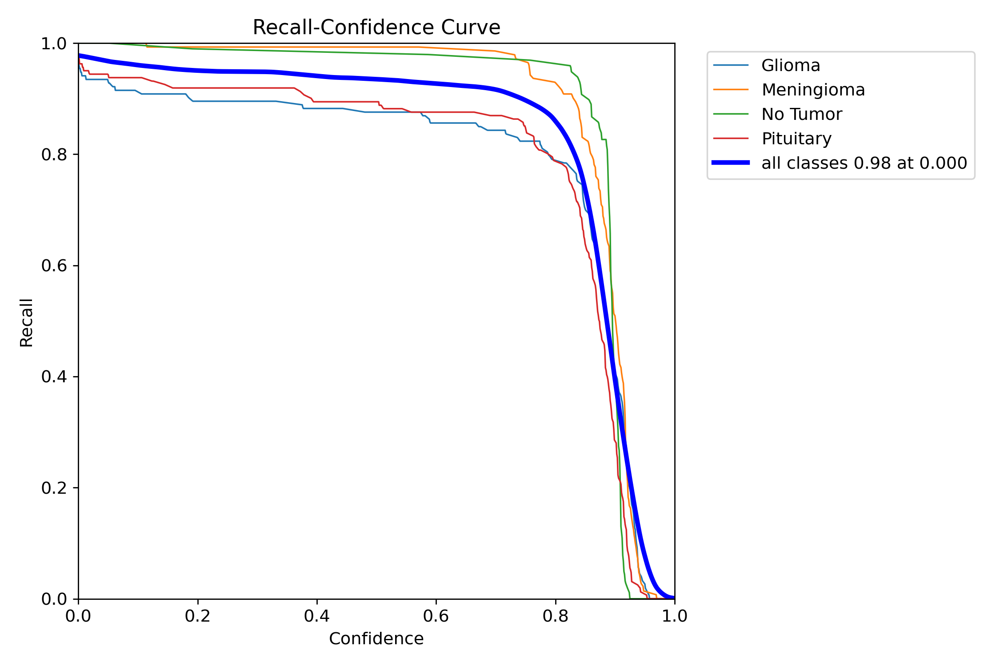

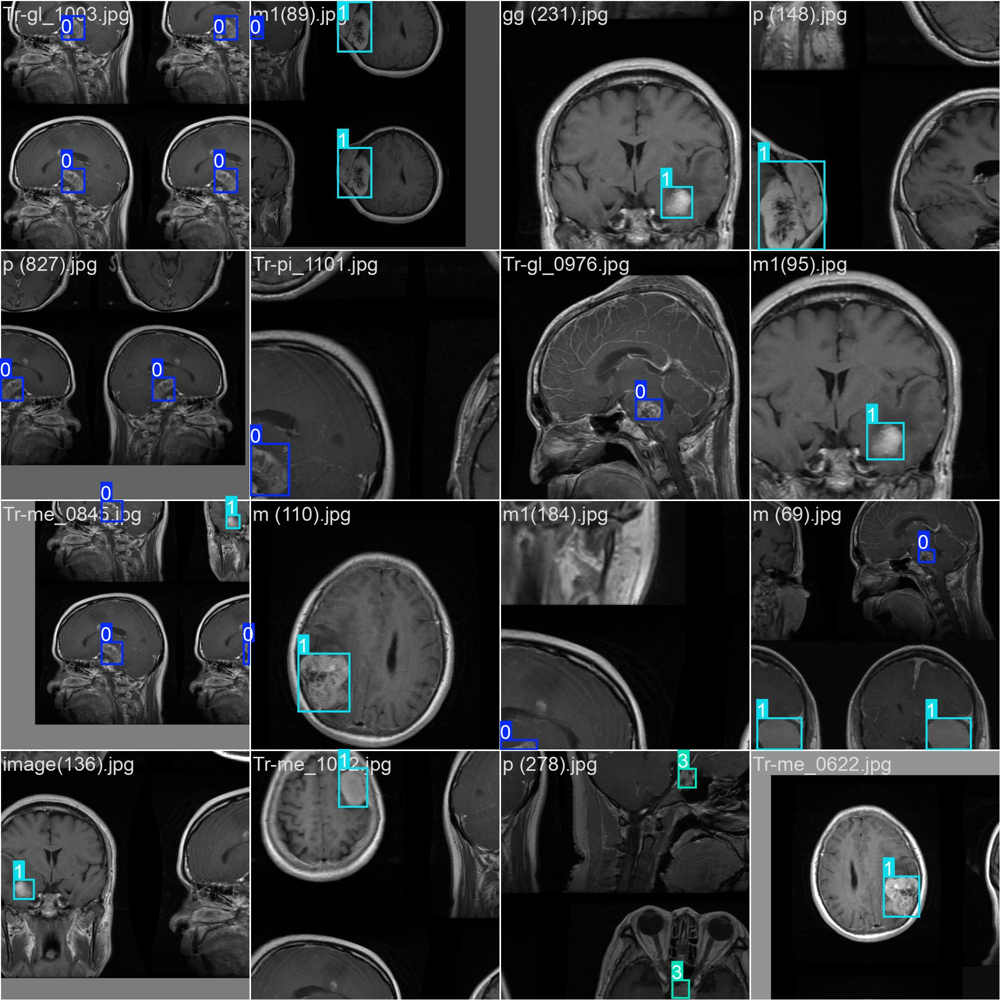

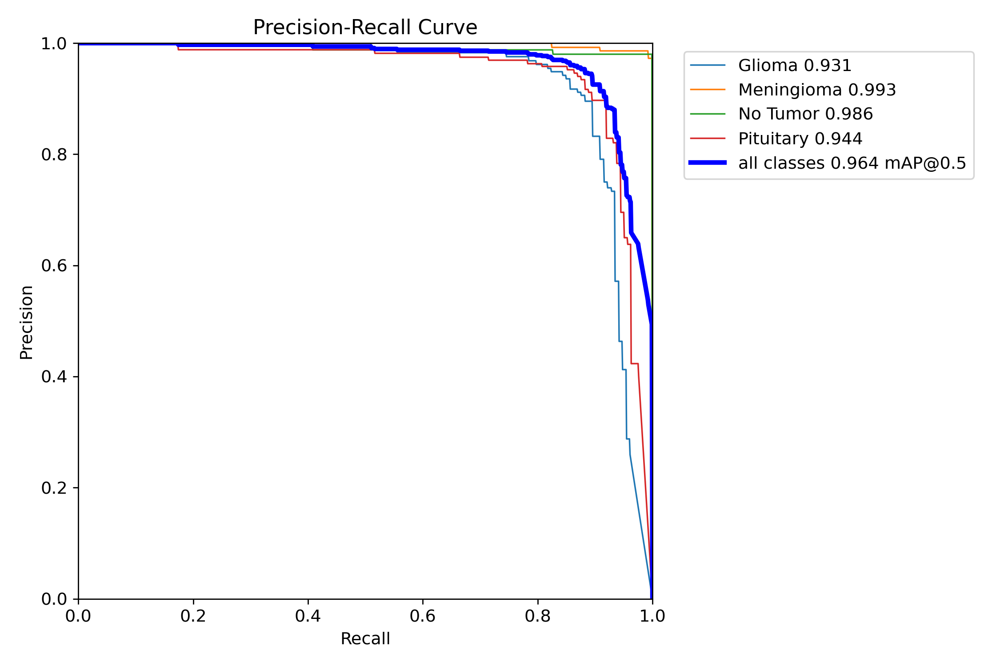

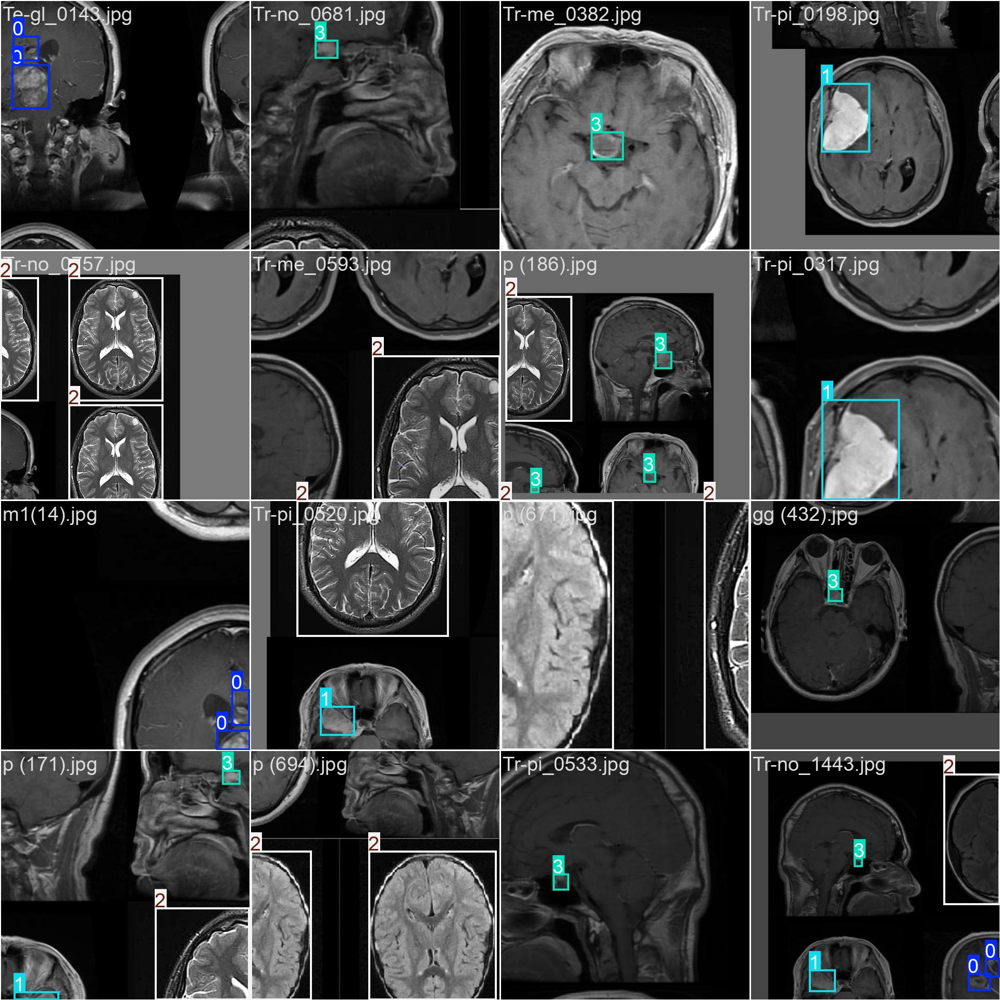

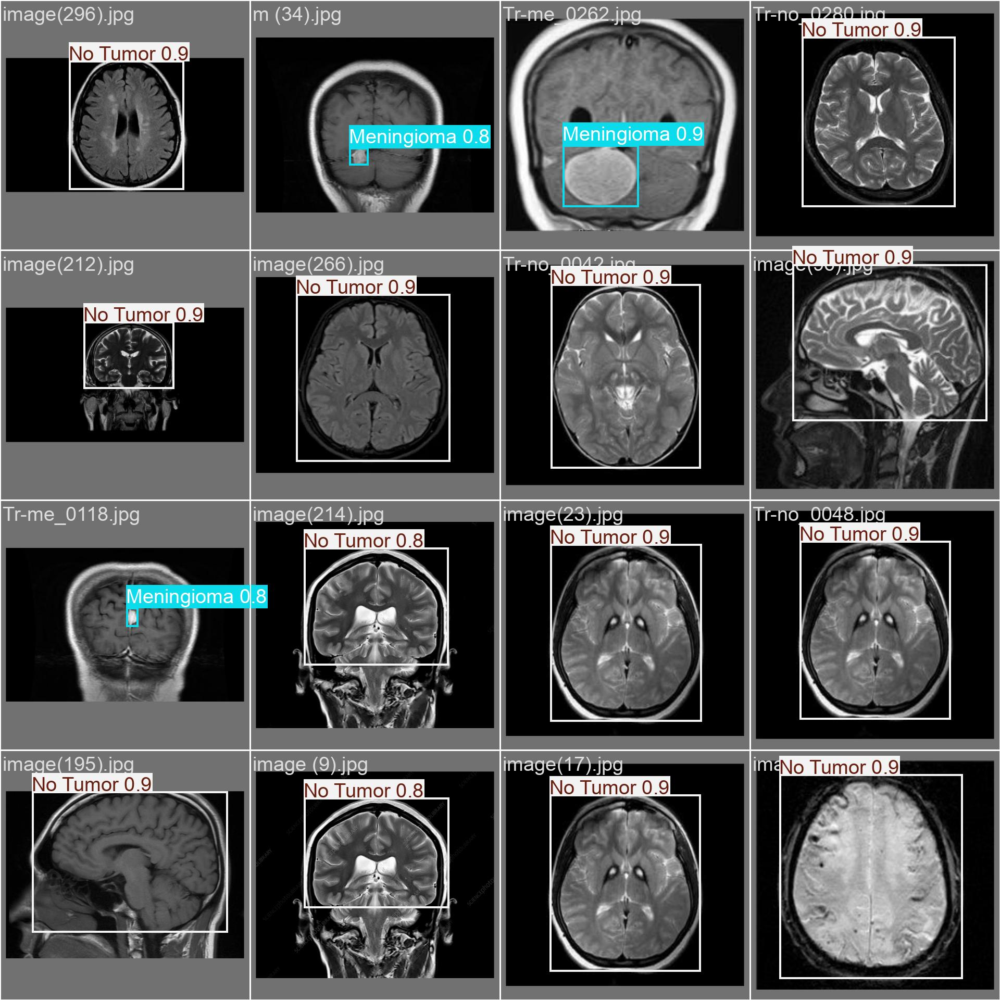

...

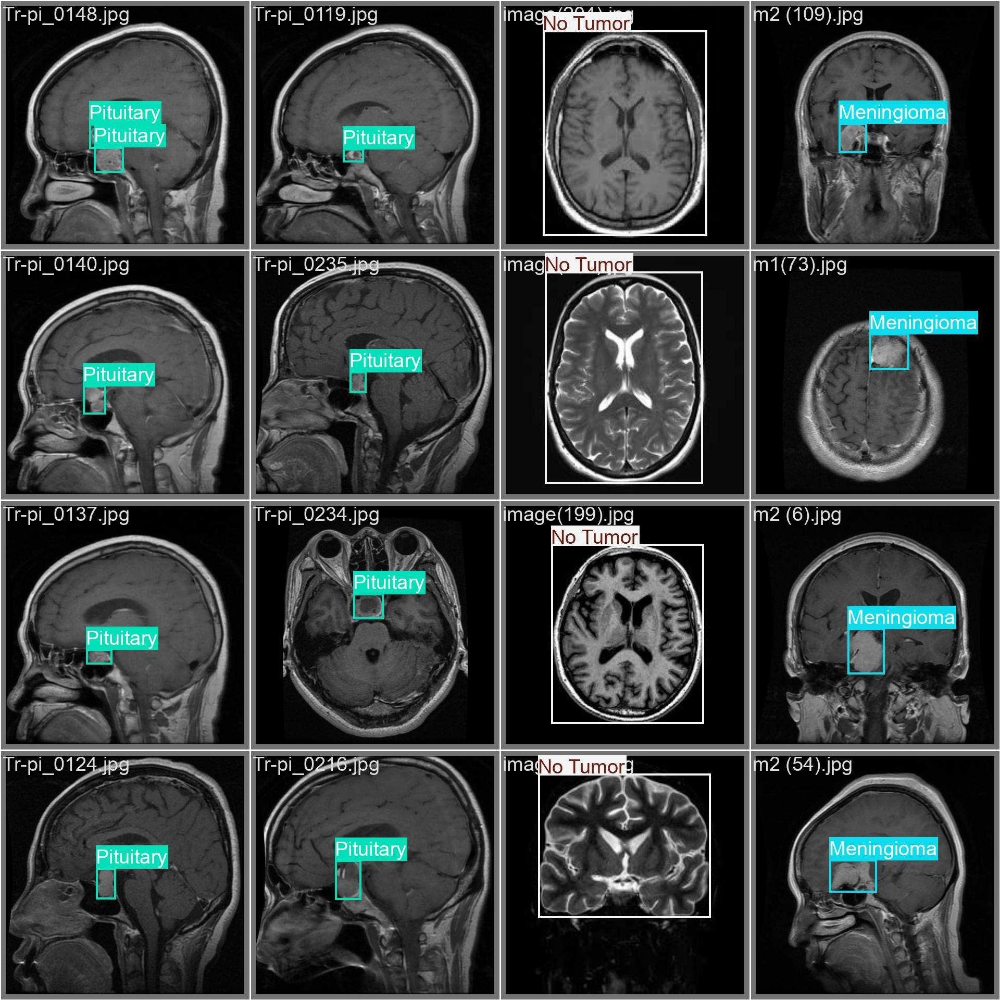

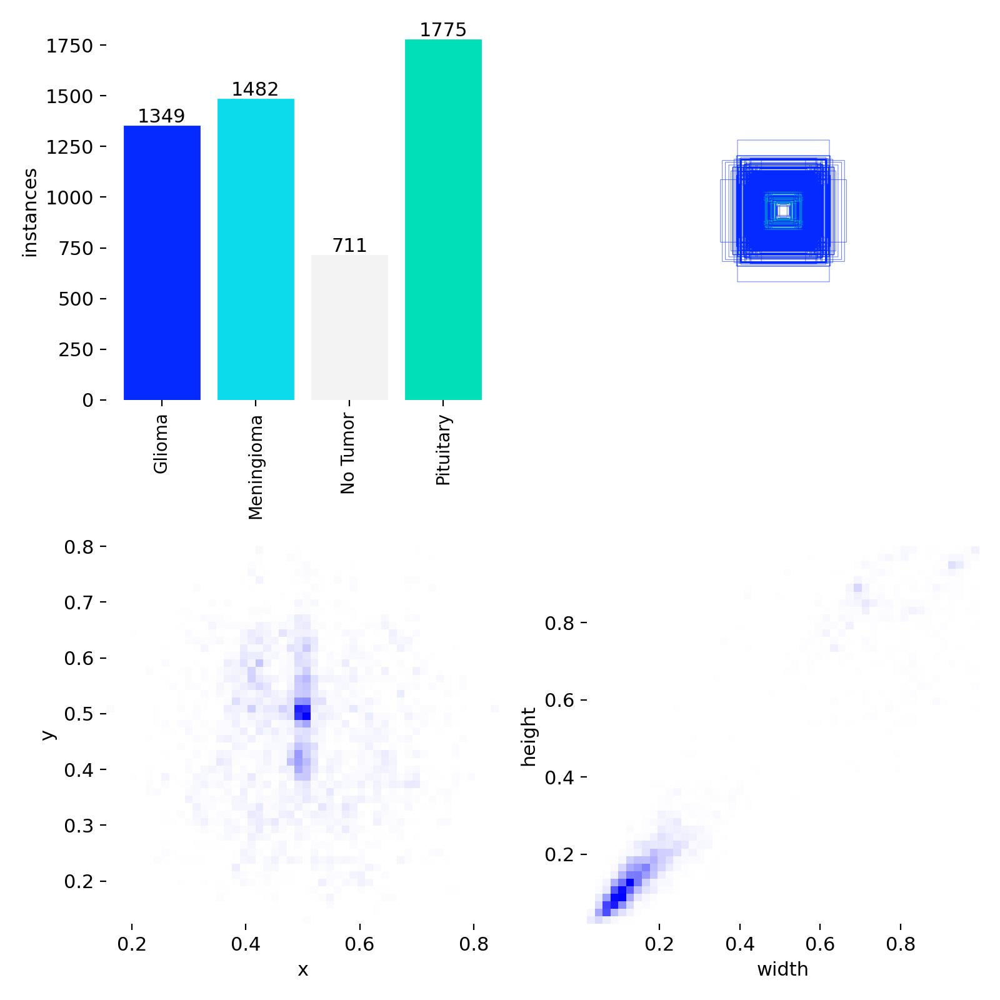

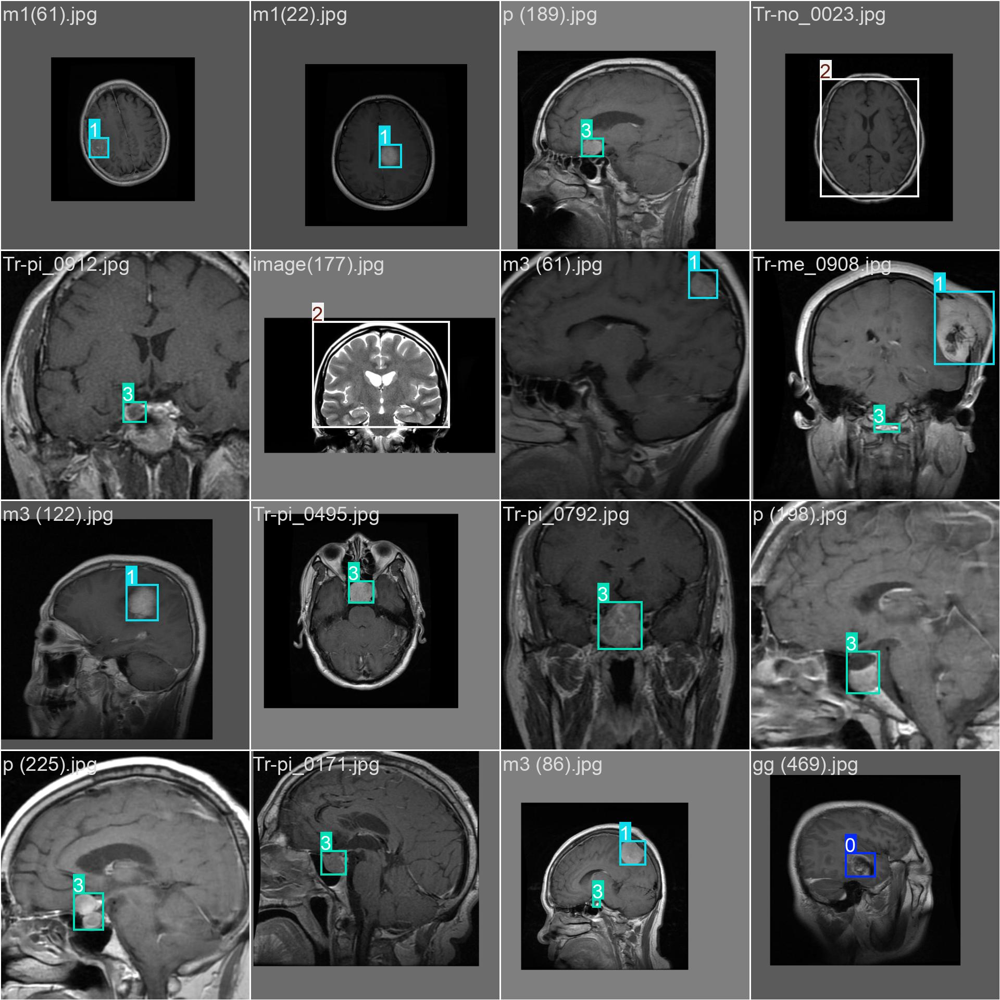

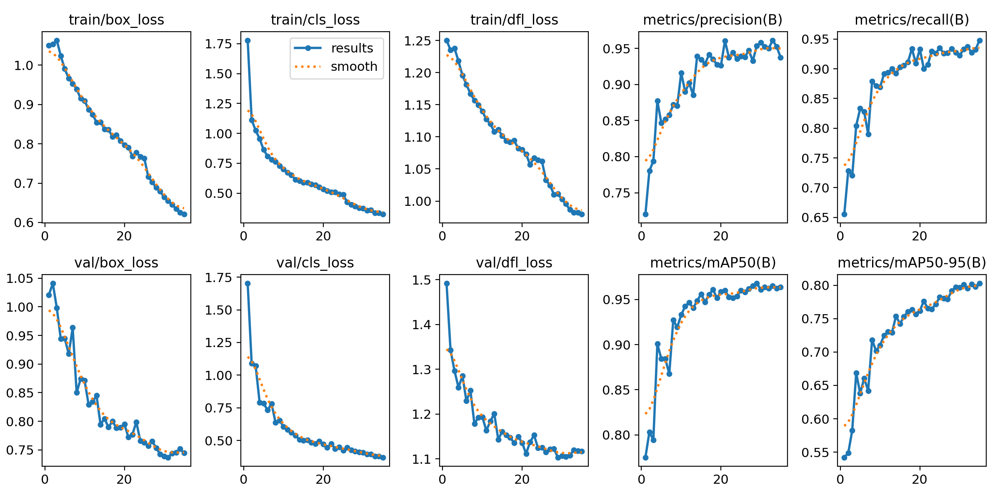

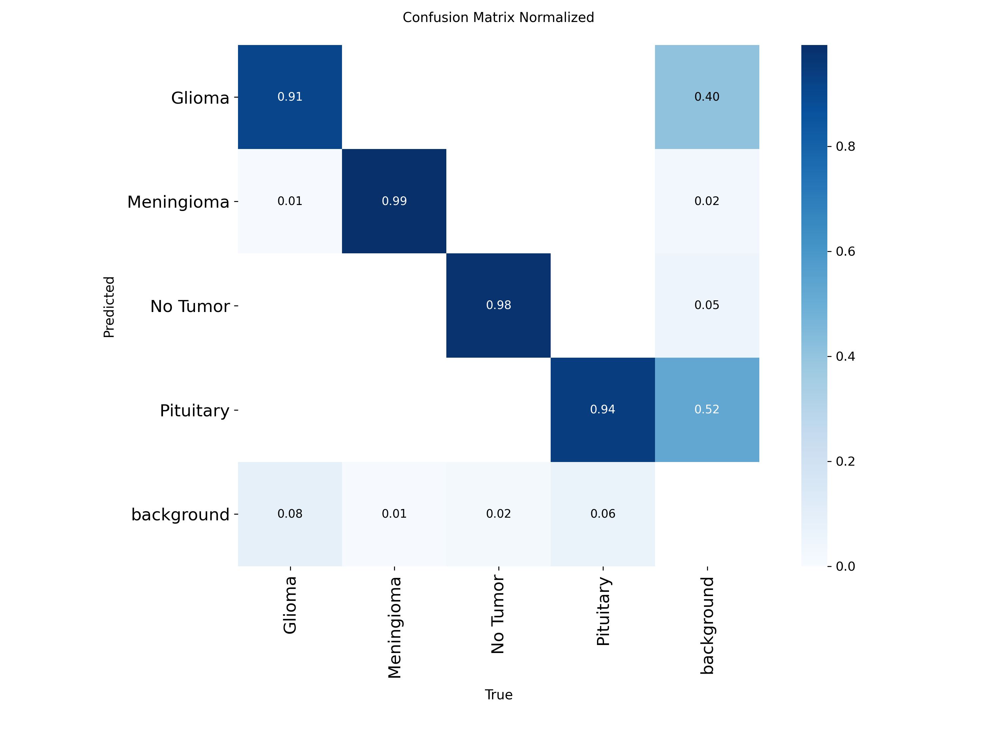

In [8]:
from IPython.display import Image,display
path='/content/runs/detect/train'
image=[f for f in os.listdir(path) if f.endswith('.jpg') or f.endswith('.png')]

for i in range(len(image)):
  display(Image(filename=path+'/'+image[i]))



0: 640x640 1 Glioma, 16.3ms
Speed: 4.2ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


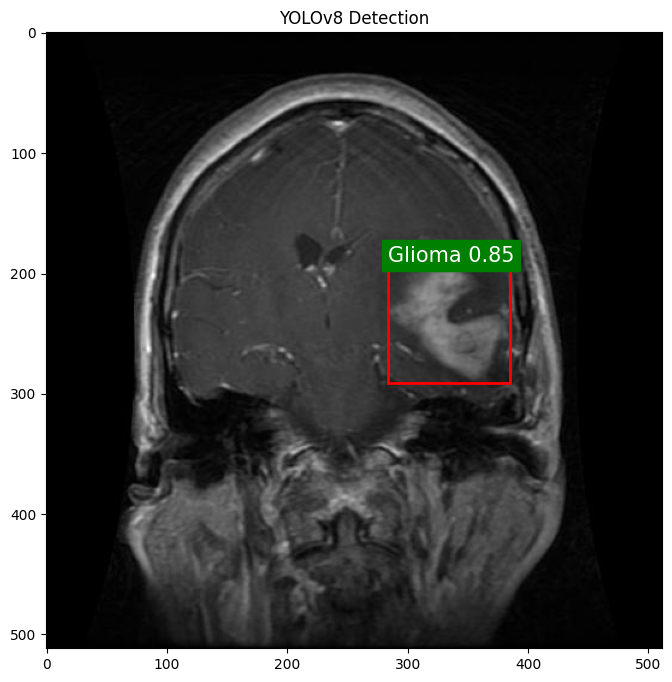


0: 640x640 1 Glioma, 16.4ms
Speed: 4.1ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


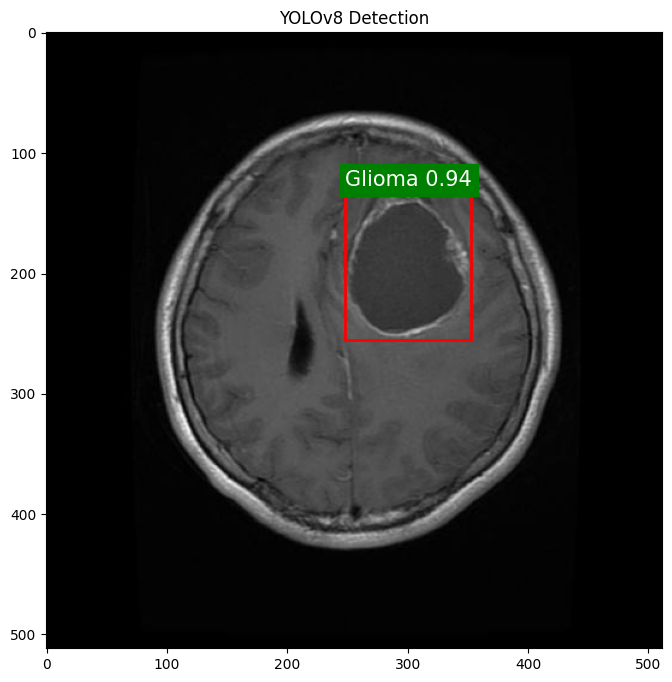


0: 640x640 1 Glioma, 16.4ms
Speed: 4.5ms preprocess, 16.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


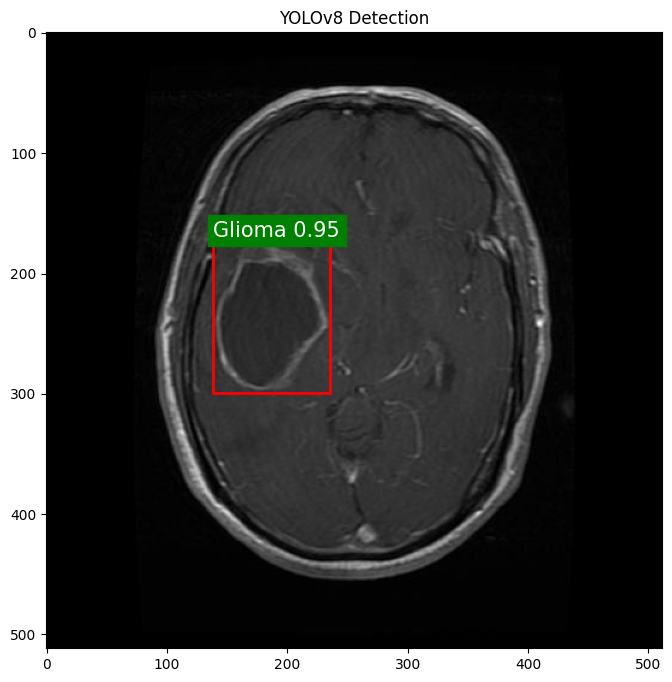


0: 640x640 1 Glioma, 17.5ms
Speed: 4.6ms preprocess, 17.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


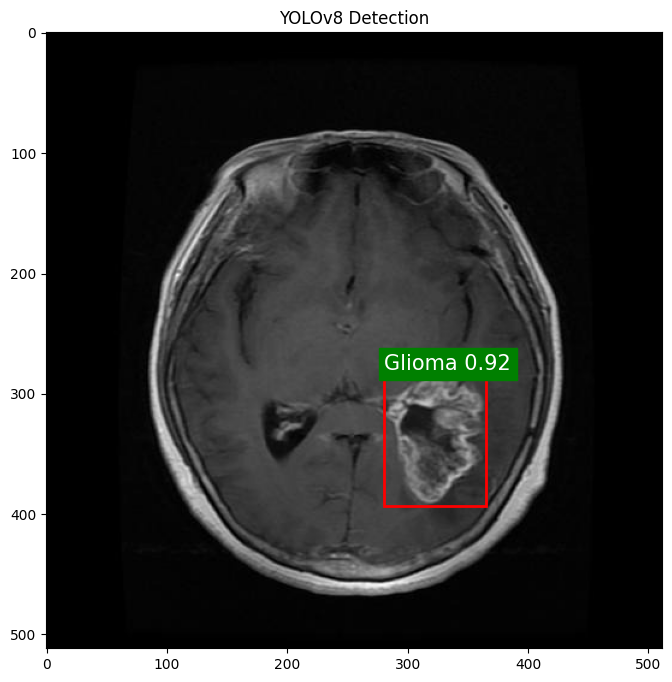


0: 640x640 1 Glioma, 1 Pituitary, 16.4ms
Speed: 4.0ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


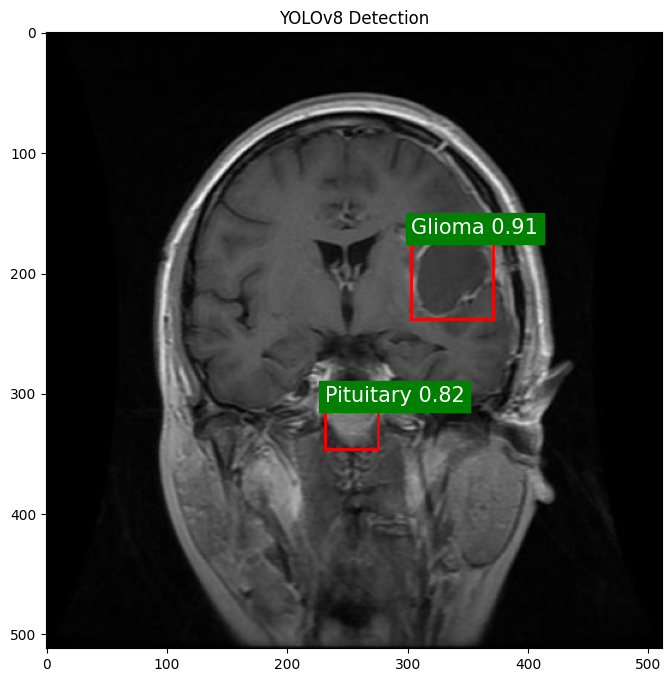


0: 640x640 1 Glioma, 16.4ms
Speed: 3.9ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


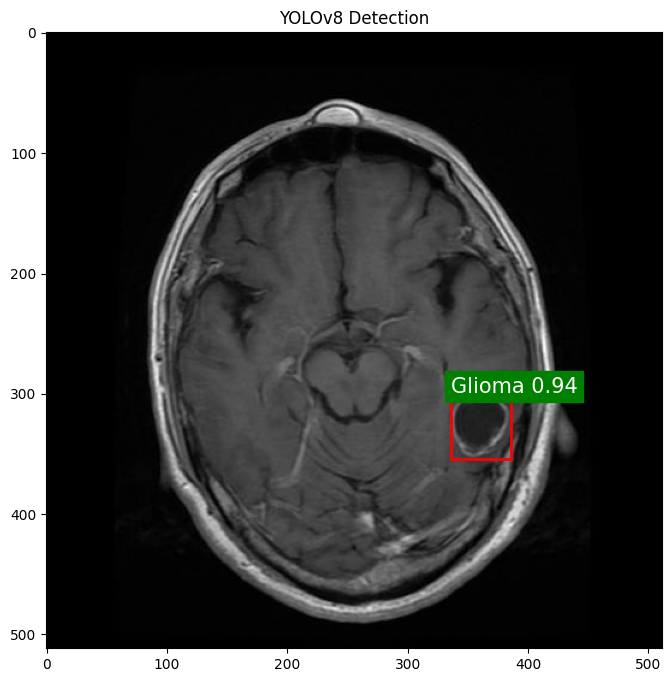


0: 640x640 1 Glioma, 16.4ms
Speed: 4.1ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


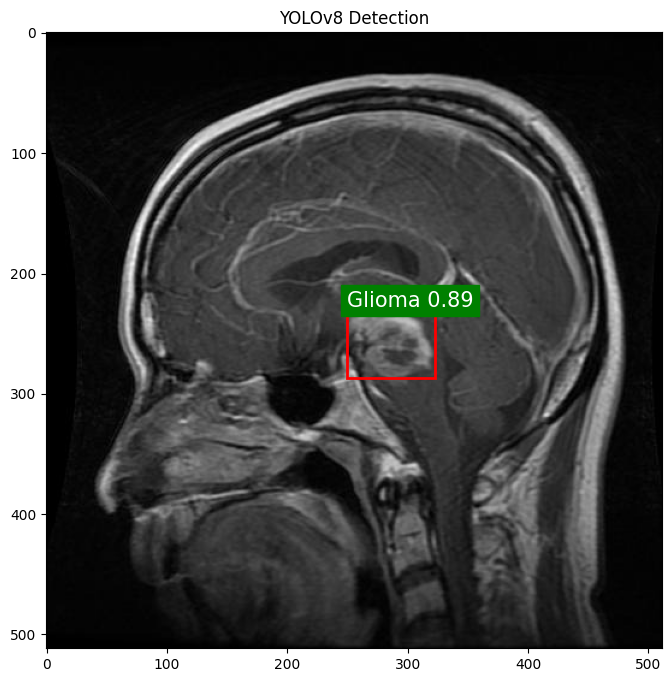


0: 640x640 1 Glioma, 18.6ms
Speed: 5.7ms preprocess, 18.6ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


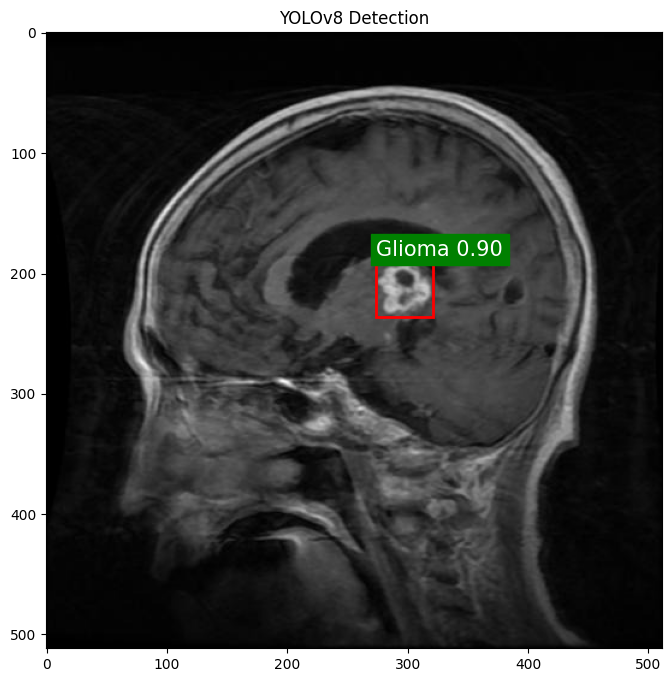


0: 640x640 1 Glioma, 16.5ms
Speed: 4.4ms preprocess, 16.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


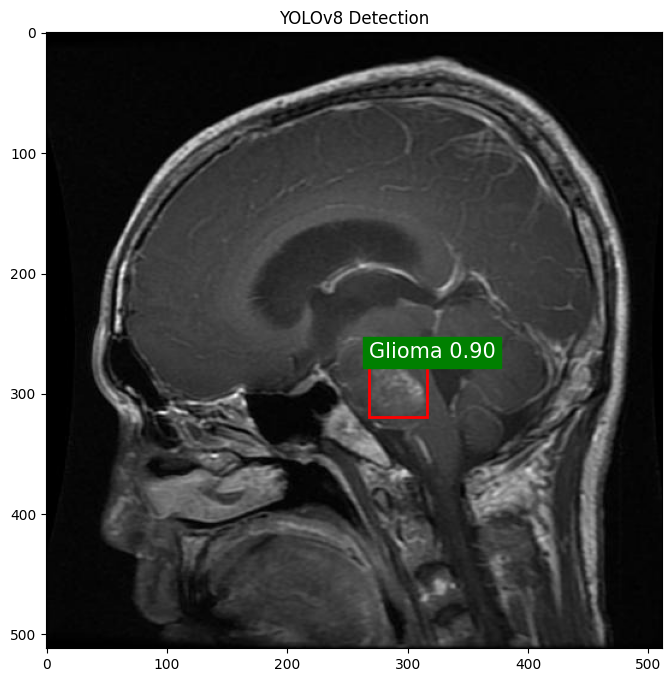


0: 640x640 2 Gliomas, 16.4ms
Speed: 4.2ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


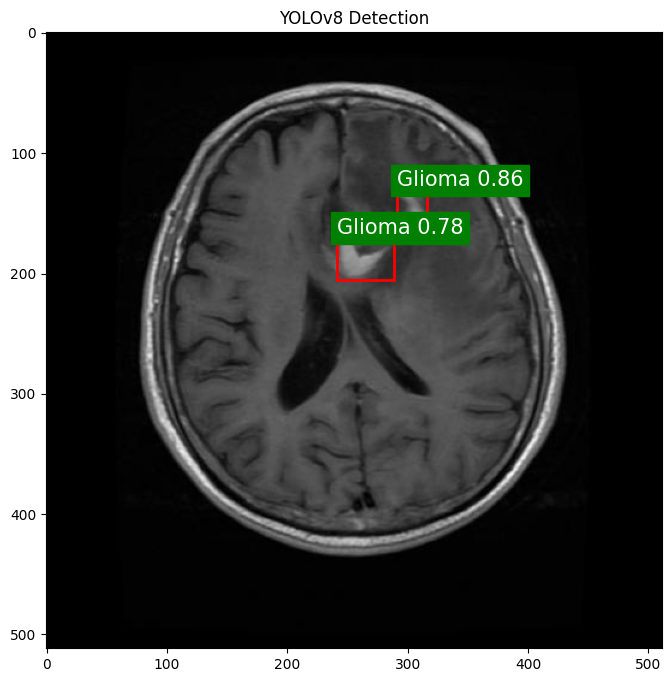


0: 640x640 1 Glioma, 16.3ms
Speed: 3.9ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


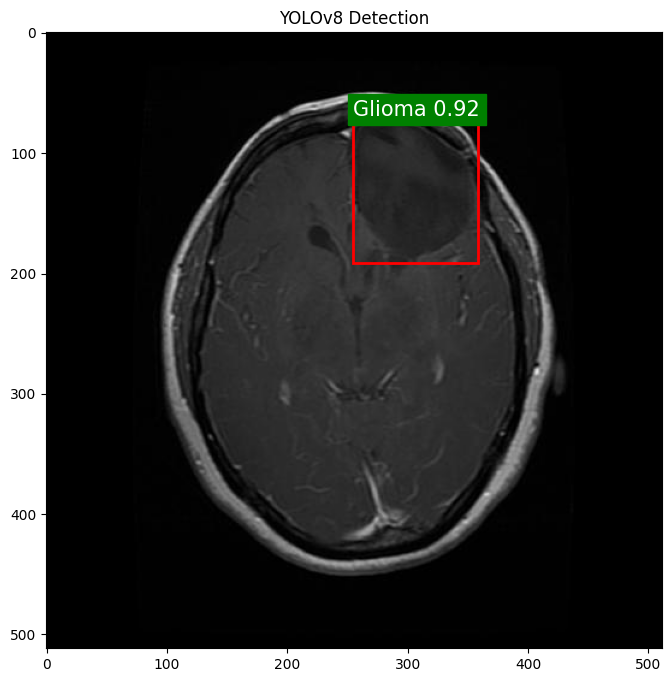


0: 640x640 1 Glioma, 16.4ms
Speed: 4.2ms preprocess, 16.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


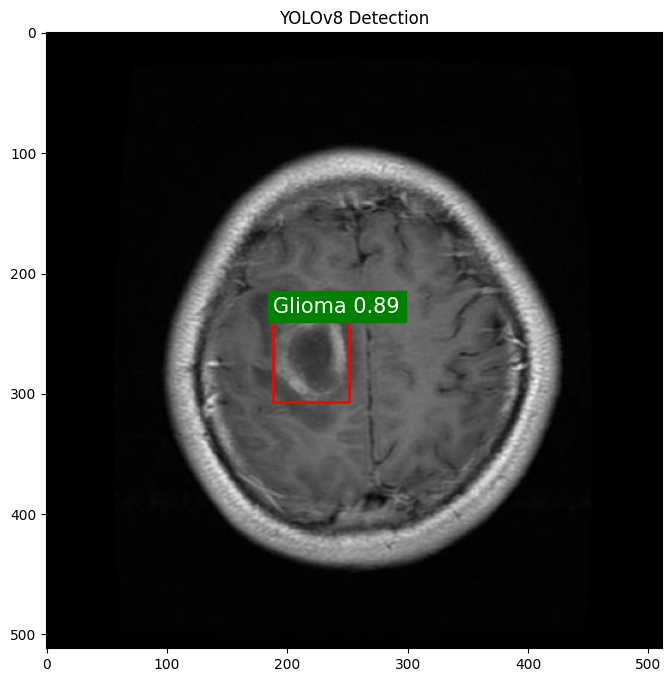


0: 640x640 1 Glioma, 1 Pituitary, 16.3ms
Speed: 3.9ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


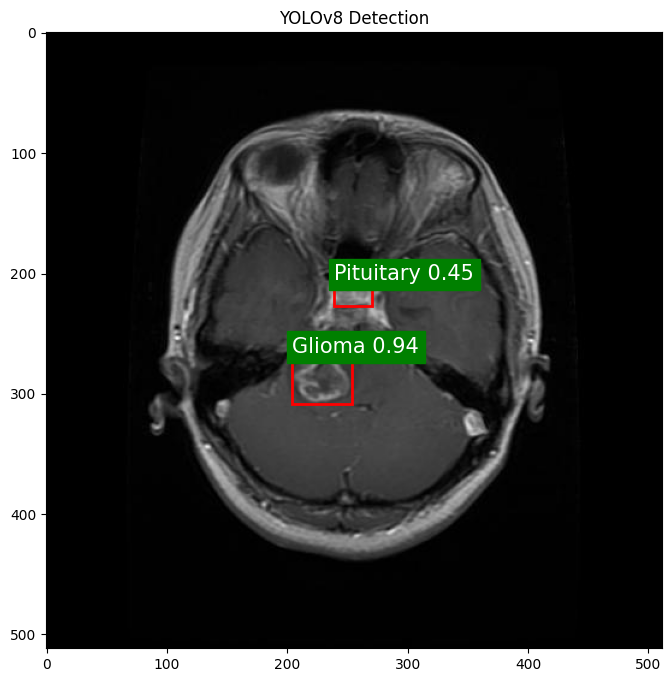


0: 640x640 (no detections), 16.4ms
Speed: 4.3ms preprocess, 16.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


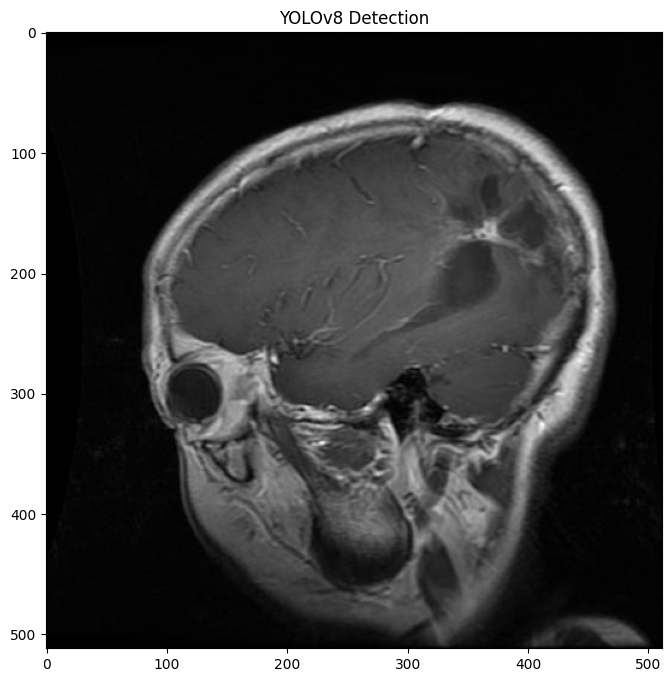


0: 640x640 1 Glioma, 18.0ms
Speed: 6.7ms preprocess, 18.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


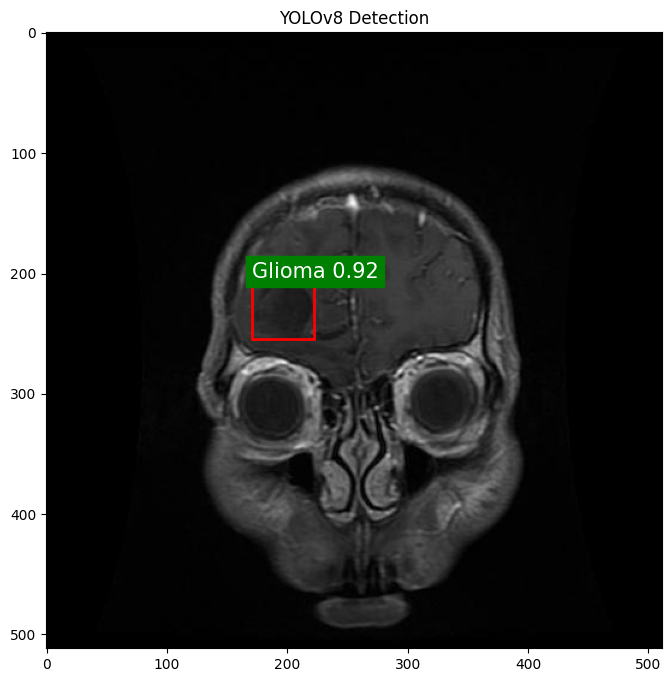


0: 640x640 1 Glioma, 17.9ms
Speed: 6.2ms preprocess, 17.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


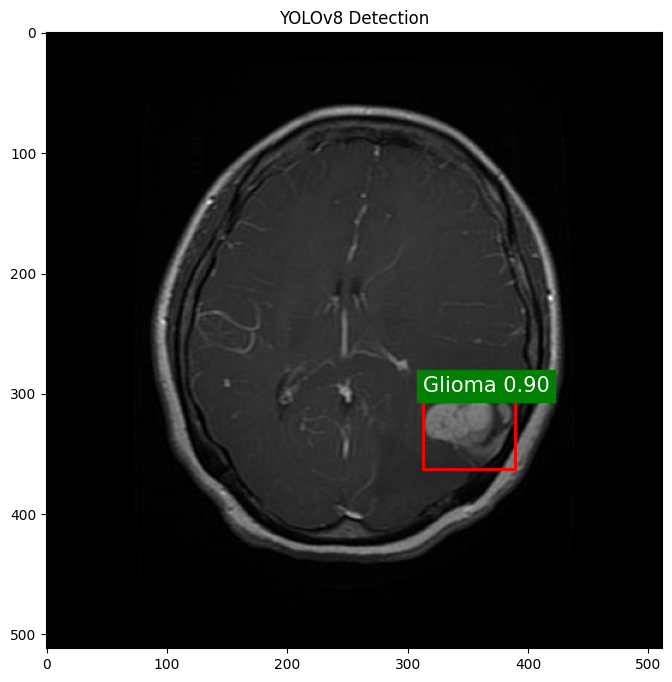


0: 640x640 1 Glioma, 16.4ms
Speed: 4.4ms preprocess, 16.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


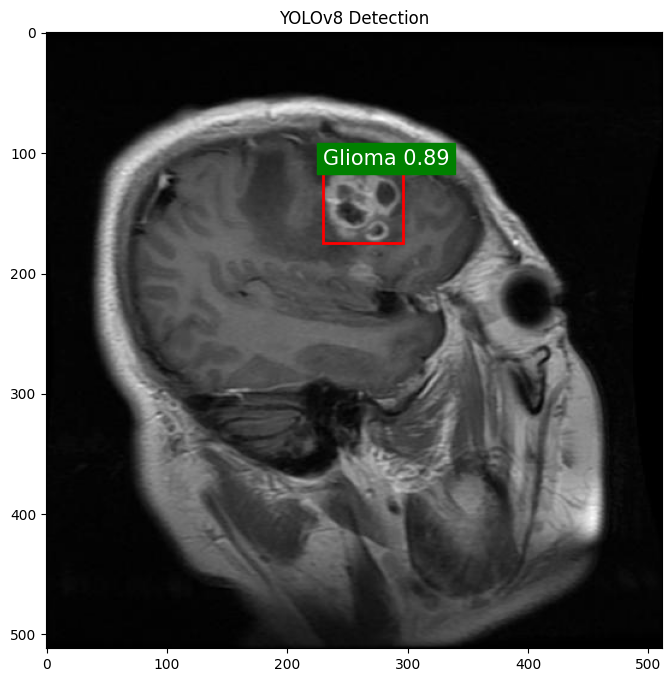


0: 640x640 1 Glioma, 16.4ms
Speed: 4.7ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


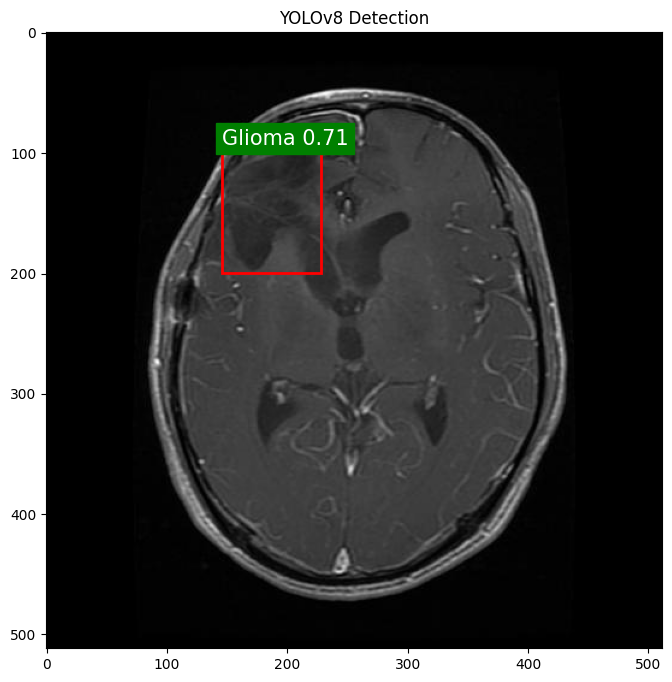


0: 640x640 1 Glioma, 18.7ms
Speed: 4.2ms preprocess, 18.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


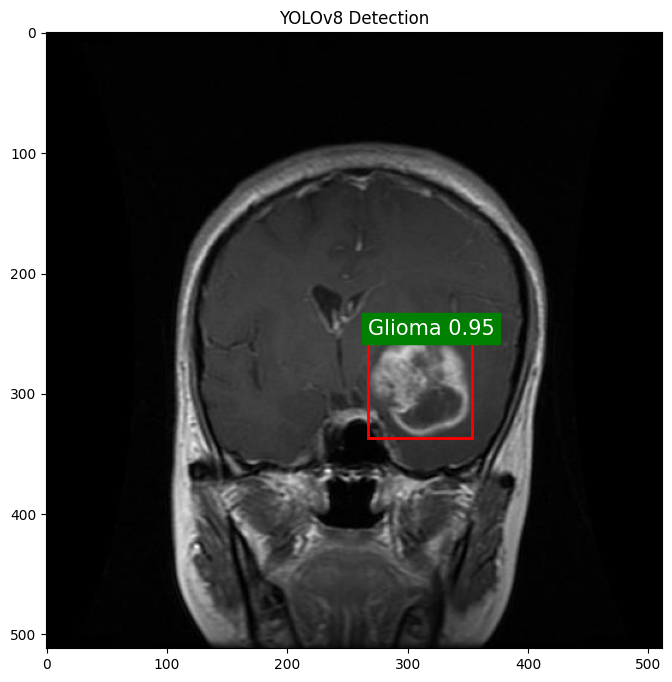


0: 640x640 1 Glioma, 22.7ms
Speed: 4.8ms preprocess, 22.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


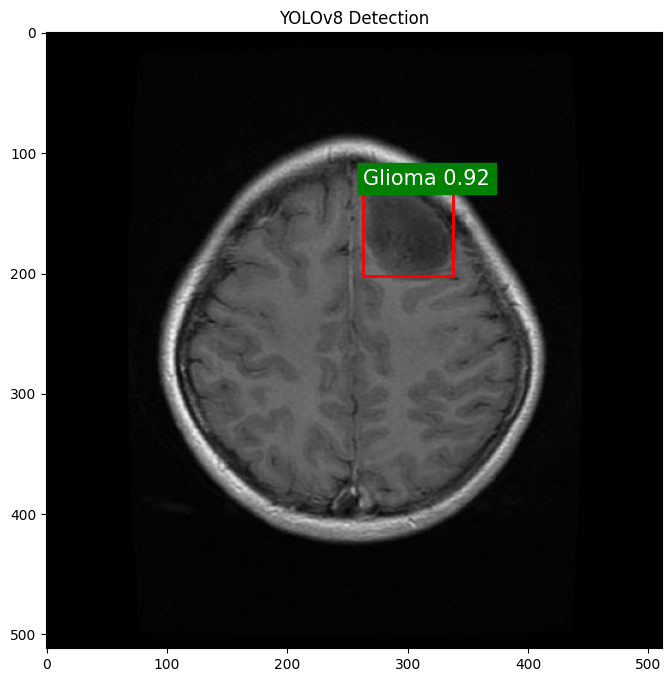


0: 640x640 1 Glioma, 21.8ms
Speed: 4.4ms preprocess, 21.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


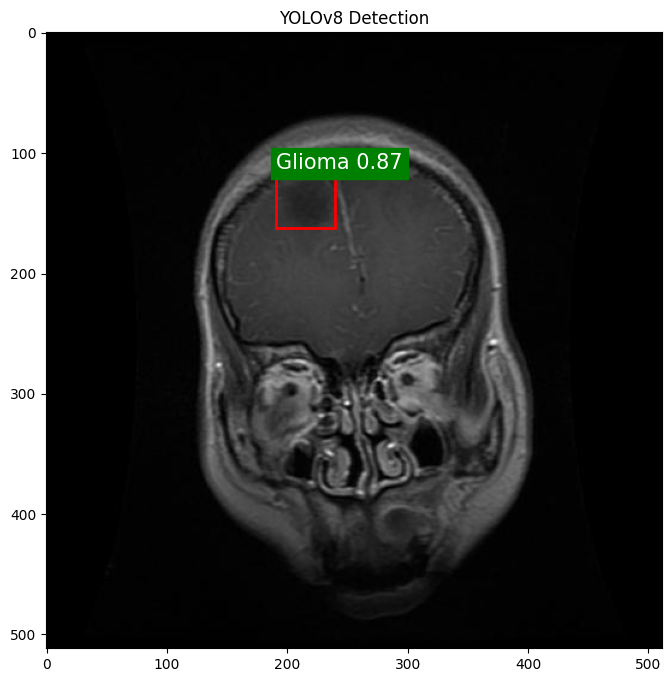


0: 640x640 3 Gliomas, 17.2ms
Speed: 6.5ms preprocess, 17.2ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


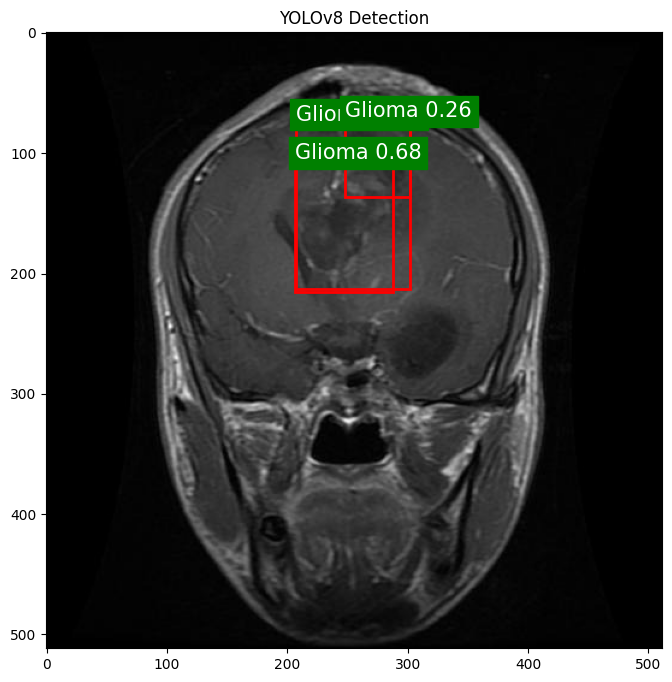


0: 640x640 1 Glioma, 16.5ms
Speed: 4.2ms preprocess, 16.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


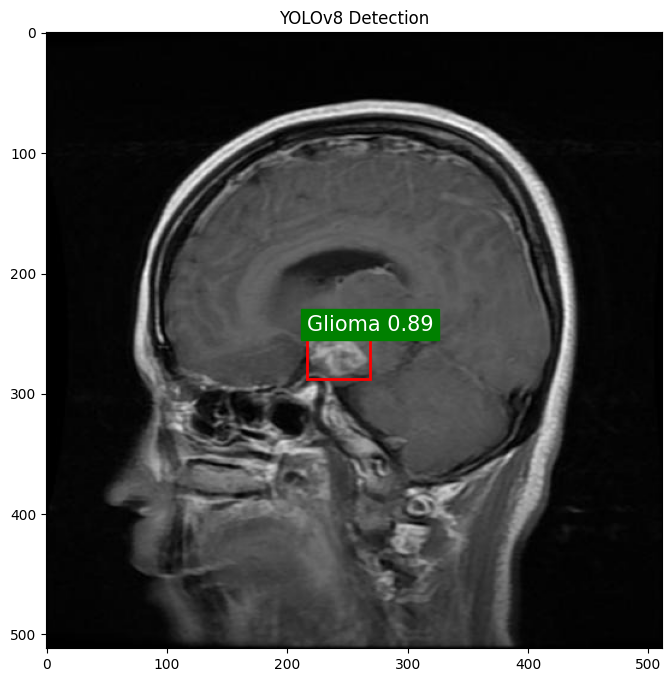


0: 640x640 1 Glioma, 16.3ms
Speed: 4.7ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


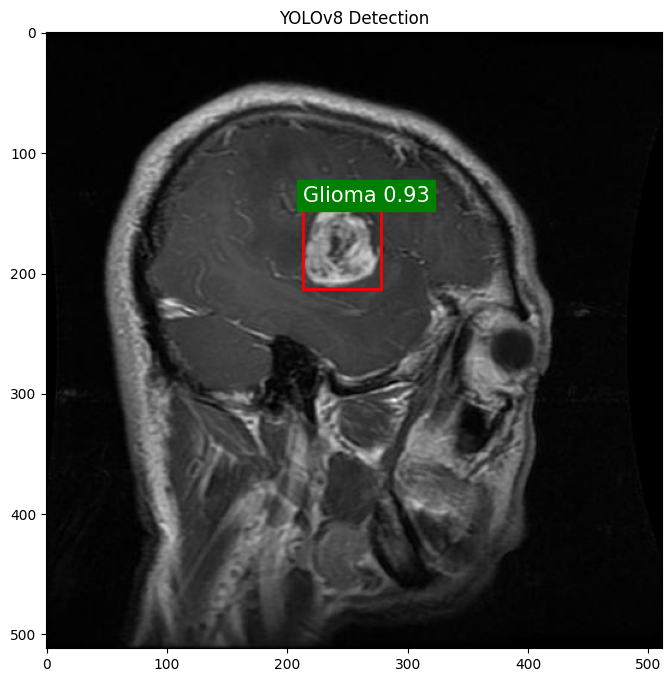


0: 640x640 1 Glioma, 16.5ms
Speed: 4.9ms preprocess, 16.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


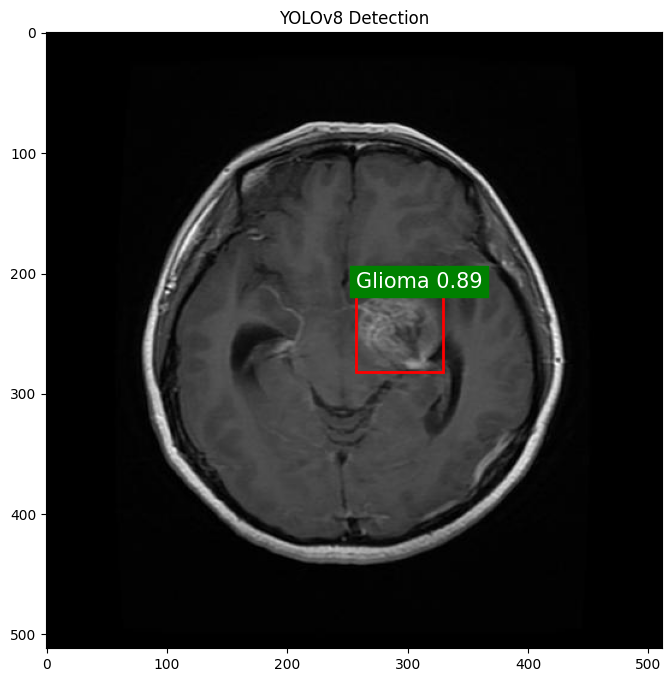


0: 640x640 1 Glioma, 17.0ms
Speed: 4.6ms preprocess, 17.0ms inference, 3.5ms postprocess per image at shape (1, 3, 640, 640)


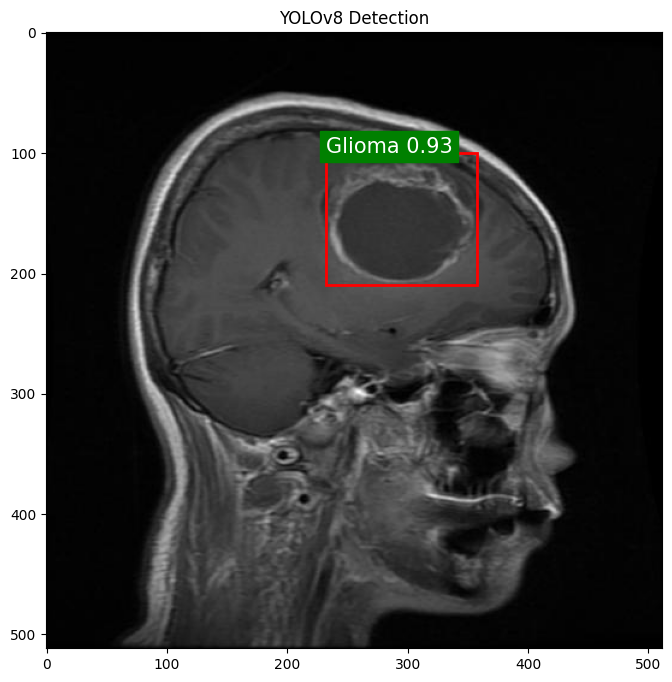


0: 640x640 1 Glioma, 16.8ms
Speed: 6.2ms preprocess, 16.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)


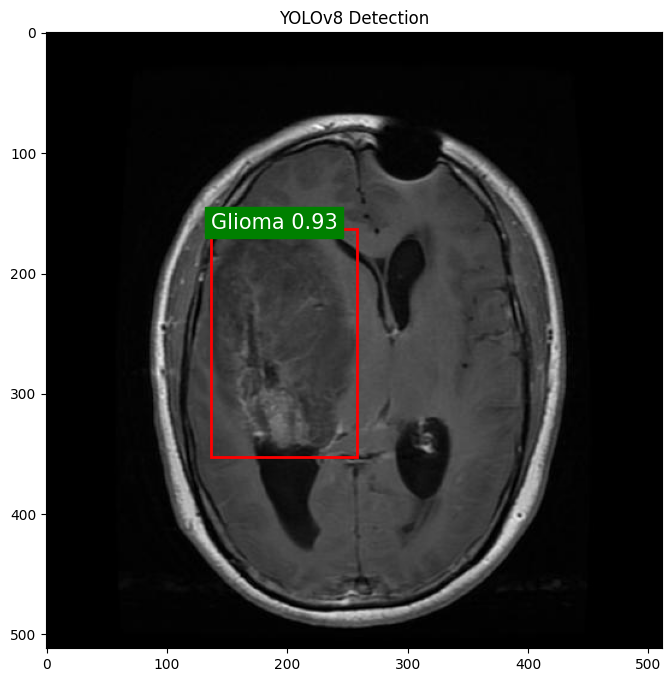


0: 640x640 4 Gliomas, 16.4ms
Speed: 5.2ms preprocess, 16.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


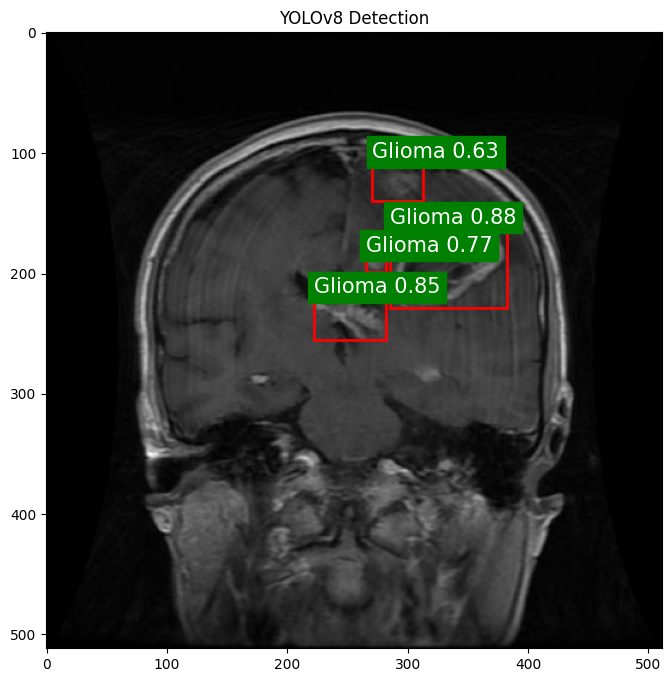


0: 640x640 2 Gliomas, 17.3ms
Speed: 4.1ms preprocess, 17.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


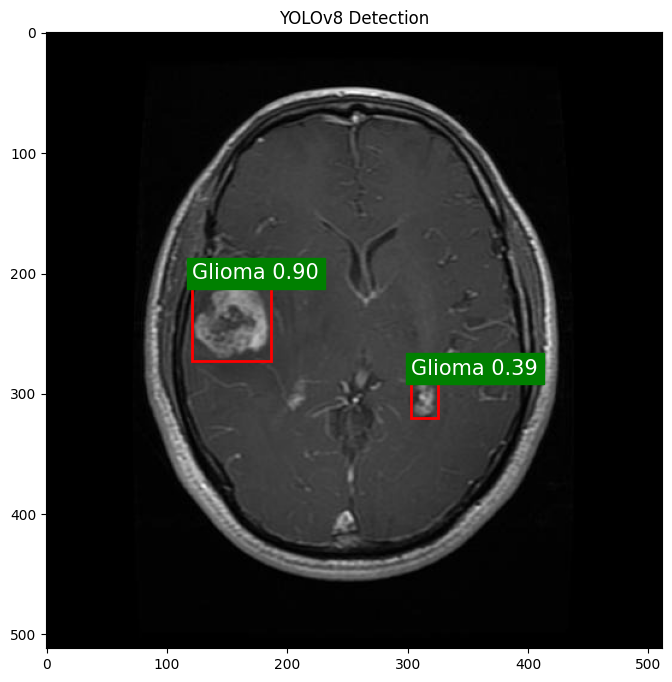


0: 640x640 1 Glioma, 16.4ms
Speed: 6.2ms preprocess, 16.4ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


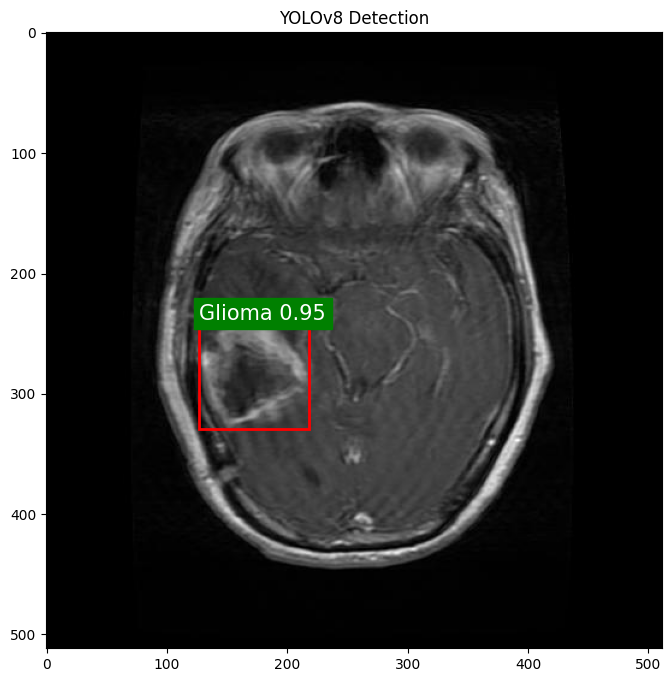


0: 640x640 1 Glioma, 16.4ms
Speed: 4.3ms preprocess, 16.4ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)


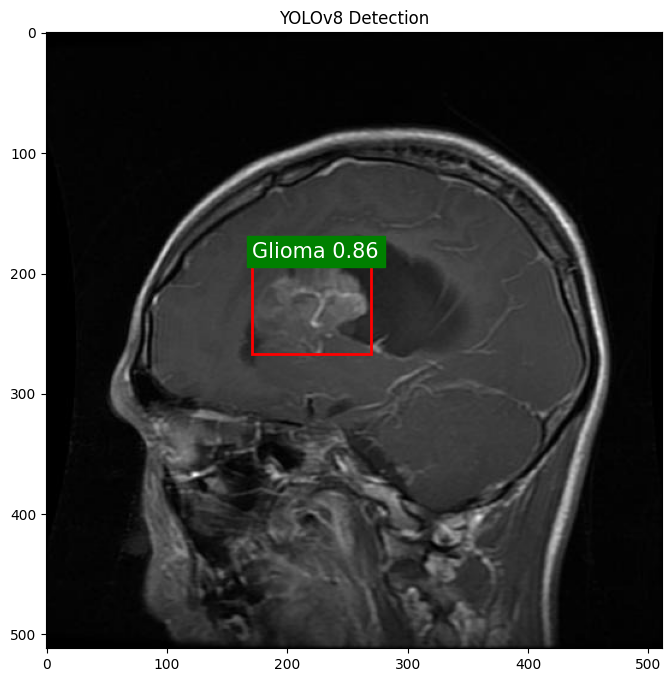


0: 640x640 1 Glioma, 16.4ms
Speed: 4.1ms preprocess, 16.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


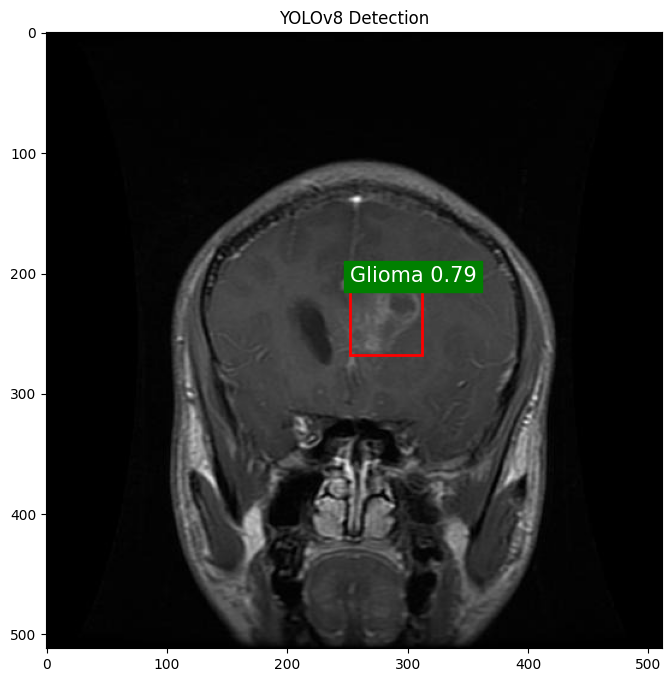


0: 640x640 3 Gliomas, 1 Pituitary, 17.2ms
Speed: 4.0ms preprocess, 17.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


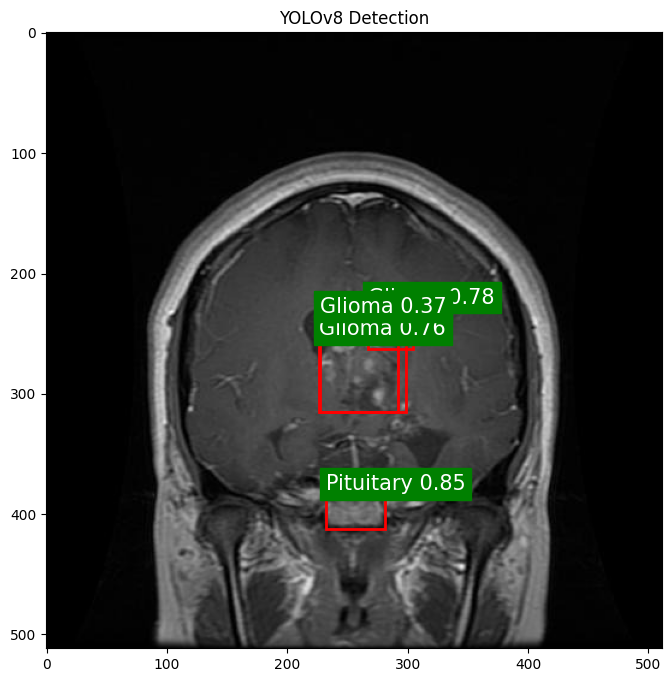


0: 640x640 1 Glioma, 16.4ms
Speed: 4.2ms preprocess, 16.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


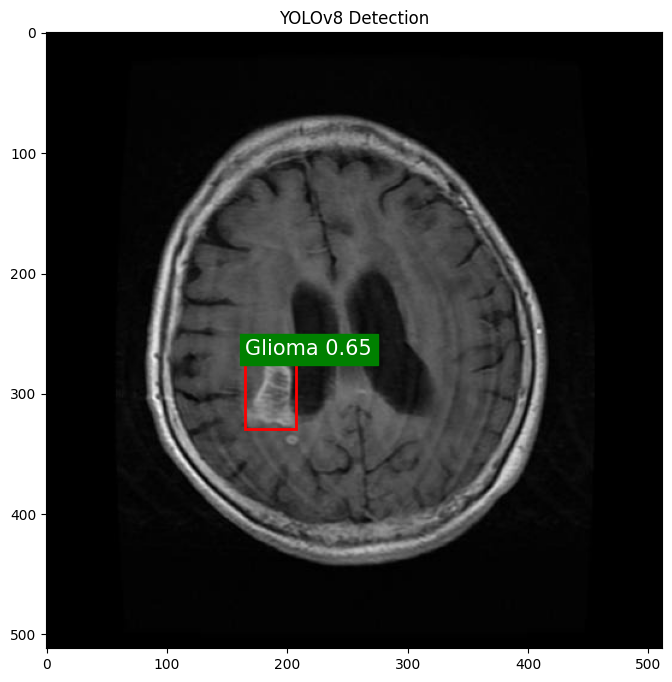


0: 640x640 1 Meningioma, 16.3ms
Speed: 4.3ms preprocess, 16.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


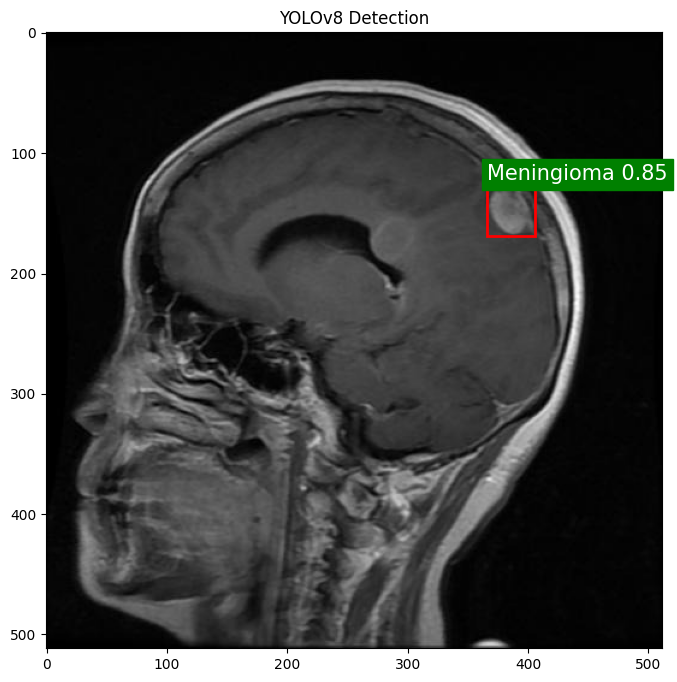

In [9]:
def display_pred(images, model):
    for i in range(35):
        img = images[i]
        result = model.predict(img)[0]

        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        ax = plt.gca()

        for detection in result.boxes:
            x1, y1, x2, y2 = detection.xyxy[0].cpu().numpy()
            conf = detection.conf[0].cpu().numpy()
            cls = detection.cls[0].cpu().numpy()
            rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            plt.text(x1, y1, f"{classes[int(cls)]} {conf:.2f}", color='white', fontsize=15, backgroundcolor='green')

        plt.title(f'YOLOv8 Detection')
        plt.show()
display_pred(val_images,model)

In [10]:
model.save("tumor.pt")